In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report
from sklearn.datasets import fetch_california_housing

In [2]:
# Loading the data
housing = fetch_california_housing(as_frame=True)
housing.data.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25


In [112]:
# Checking NaN cells
print(housing.data.shape)
housing.data.isna().sum()

(20640, 8)


MedInc        0
HouseAge      0
AveRooms      0
AveBedrms     0
Population    0
AveOccup      0
Latitude      0
Longitude     0
dtype: int64

In [3]:
# Loading the data
X, y = fetch_california_housing(return_X_y=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7)

# Scaling the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

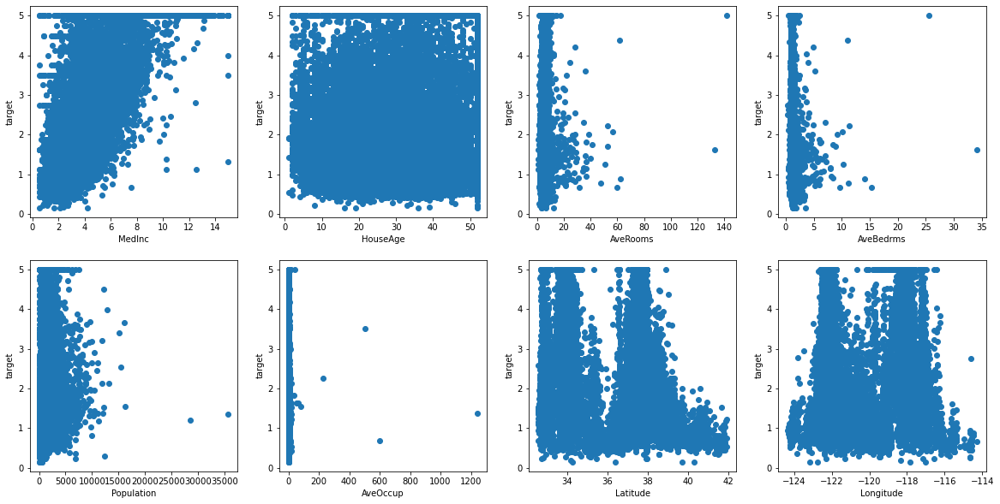

In [115]:
# Plotting the columns with the target values
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

for i in range(X.shape[1]):
    axs[i // 4, i % 4].set_xlabel(housing.data.columns[i])
    axs[i // 4, i % 4].set_ylabel('target')
    axs[i // 4, i % 4].scatter(X[:,i], y);

In [116]:
print(X.shape)
print(X_train.shape, X_test.shape)

(20640, 8)
(14447, 8) (6193, 8)


---
# Linear regression

Linear regression is good for this type of data set since all the target values and the variables seem to have some linear dependence among them. However, I want to try 2 types of linear regression for this particular data set: ridge and lasso regression with different regularizations(L2 and L1 respectively). For that, I am going to also use GridSearchCV to find the best pair of estimators for the both regression models.

In [4]:
from sklearn.linear_model import Ridge, Lasso
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

## Ridge

In [5]:
parameters = {'alpha': [10**i for i in range(-3, 5)]}

ridge = Ridge()
clf = GridSearchCV(ridge, parameters)
clf.fit(X_train, y_train)

print('Best parameters:', clf.best_params_)
print('Accuracy:', clf.score(X_test, y_test))
y_pred = clf.predict(X_test)
loss = 0
for y1, y2 in zip(y_pred, y_test):
    loss += (y1 - y2)**2
print('Loss:', np.sqrt(loss) / len(y_pred))

Best parameters: {'alpha': 10}
Accuracy: 0.6192236785752303
Loss: 0.009140928371228232


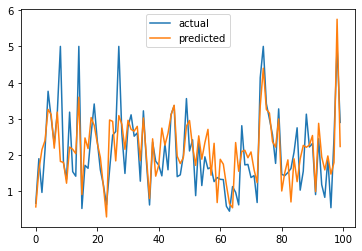

In [8]:
plt.plot(y_test[:100], label='actual');
plt.plot(y_pred[:100], label='predicted');
plt.legend();

## Lasso

In [10]:
parameters = {'alpha': [10**i for i in range(-3, 5)]}

lasso = Lasso(alpha=0.001)
clf = GridSearchCV(lasso, parameters)
clf.fit(X_train, y_train)

print('Best parameters:', clf.best_params_)
print('Accuracy:', clf.score(X_test, y_test))
y_pred = clf.predict(X_test)
loss = 0
for y1, y2 in zip(y_pred, y_test):
    loss += (y1 - y2)**2
print('Loss:', np.sqrt(loss) / len(y_pred))

Best parameters: {'alpha': 0.001}
Accuracy: 0.6189751637392118
Loss: 0.009143910812175153


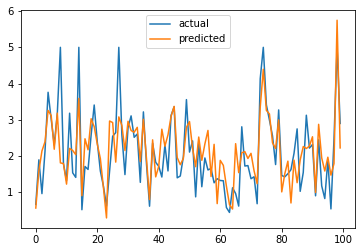

In [11]:
plt.plot(y_test[:100], label='actual');
plt.plot(y_pred[:100], label='predicted');
plt.legend();

---
# VPI model

This model works slow when the given data set has lots of points; this is one of the disadvantages of this algorithm. However, I wanted to give it a try.

Best loss: 1.8501517469188828


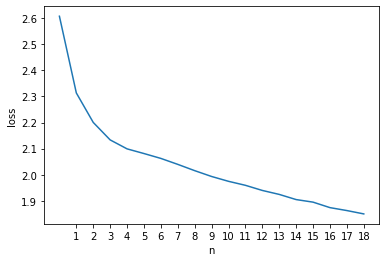

In [13]:
import vpi
import importlib
importlib.reload(vpi)
from vpi import *

losses = list()
for i in range(1, 20):
    y_pred = vpi(X_test[:500], X_train[:1000], y_train[:1000], n=i)
    loss = 0
    for j in range(len(y_pred)):
        loss += (y_pred[j] - y_train[j])**2
    losses.append(loss / len(y_pred))
print('Best loss:', min(losses))
plt.xlabel('n')
plt.ylabel('loss')
plt.xticks(np.arange(1,20,1))
plt.plot(losses);

We can see that this model is not so much efficient to use for this particular data set. There are two reasons for this: *it is slow* and *it has bigger loss*. The below is to show the results of even higher **n** values for the model. The result gradually tends to get better when the **n** increases. However, the change of **loss** respective to the change of **n** vanishes as the **n** increases.

Best loss: 1.3196462354246807


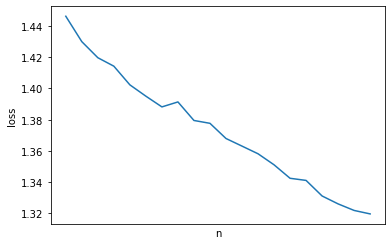

In [136]:
losses = list()
for i in range(20, 40):
    y_pred = vpi(X_test[:100], X_train[:1000], y_train[:1000], n=3*i)
    loss = 0
    for j in range(len(y_pred)):
        loss += (y_pred[j] - y_train[j])**2
    losses.append(loss / len(y_pred))
print('Best loss:', min(losses))
plt.xlabel('n')
plt.ylabel('loss')
plt.xticks(np.arange(20*3,40*3,3))
plt.plot(losses);

Since the model is so slow, the predictions have been made by using only 1000 samples of the training data set with **n=120**.

In [14]:
y_pred = vpi(X_test, X_train[:1000], y_train[:1000], n=120)
loss = 0
for i in range(len(y_pred)):
    loss += (y_pred[i] - y_test[i])**2
print('Loss:', np.sqrt(loss) / len(y_pred))

Loss: 0.011145791088864975


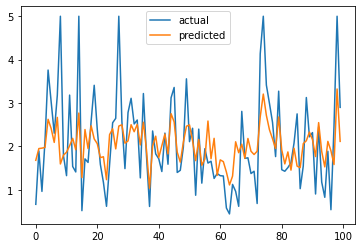

In [15]:
plt.plot(y_test[:100], label='actual');
plt.plot(y_pred[:100], label='predicted');
plt.legend();